# Семинар 1 - Основы работы с OpenCV, цветовые пространства, интегральные изображения

***

Источник используемого аэрофотоснимка: https://sovzond.ru/upload/medialibrary/267/%D0%98%D1%81%D1%85%D0%BE%D0%B4%D0%BD%D1%8B%D0%B9-%D0%B0%D1%8D%D1%80%D0%BE%D1%84%D0%BE%D1%82%D0%BE%D1%81%D0%BD%D0%B8%D0%BC%D0%BE%D0%BA.jpg

In [1]:
from pathlib import Path

import cv2
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
IMG_PATH = "data/Lenna_test_image.jpeg"

# if not Path(IMG_PATH).exists():
#     !git clone https://github.com/alexmelekhin/cv_course_2025.git
#     !mv cv_course_2024/seminars/seminar_01/data .

# 1. Основы работы с OpenCV

## Чтение, отображение и сохранение изображений

Для чтения изображения из файла используется функция `cv2.imread`, для отображения изображения на экране - функция `cv2.imshow`, для сохранения изображения в файл - функция `cv2.imwrite`.

`cv2.imread(path, flag)` - читает изображение из файла по пути path. Флаг flag определяет формат считывания изображения. Возможные значения флага:
- `cv2.IMREAD_COLOR` - считывание изображения в цвете (значение по умолчанию, можно не указывать в явном виде)
- `cv2.IMREAD_UNCHANGED` - считывание изображения в цвете "как есть" (с альфа-каналом, если он есть)
- `cv2.IMREAD_GRAYSCALE` - считывание изображения в оттенках серого

In [3]:
img = cv2.imread(IMG_PATH, cv2.IMREAD_COLOR)  # cv2.IMREAD_COLOR обычно не указывают, так как это значение по умолчанию

`cv2.imshow("window_name", image)` - отображает изображение img в окне с именем window_name. Если окно с таким именем не существует, то оно будет создано. Если окно существует, то оно будет очищено и в нем будет отображено изображение img.

Пример кода:
```python
import cv2

img = cv2.imread("image.jpg", cv2.IMREAD_COLOR)
cv2.imshow("image", img)
cv2.waitKey(0)  # ожидание нажатия клавиши, иначе окно закроется сразу же
cv2.destroyAllWindows()  # закрытие всех окон
```

Однако это работает только в скриптах при наличии GUI. Пример такого скрипта: [show_image.py](show_image.py)

В Jupyter Notebook для отображения изображения используется функция `plt.imshow`.

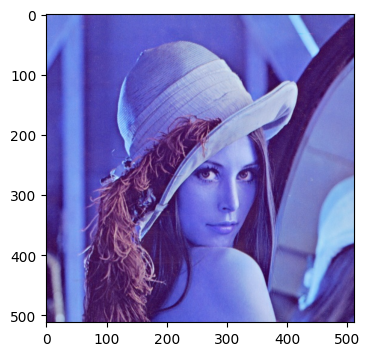

In [4]:
plt.figure(figsize=[4, 4])
plt.imshow(img);

Как видно, цвета изображения неправильные. **Функция `cv2.imread` считывает изображения в формате BGR** (blue, green, red). Чтобы перейти к более привычному представлению RGB (reg, green, blue), который ожидает matplotlib, можно воспользоваться встроенной функцией cvtColor:

In [5]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

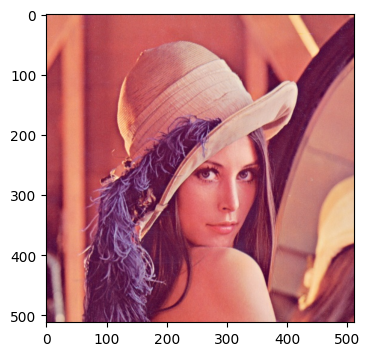

In [6]:
plt.figure(figsize=[4, 4])
plt.imshow(img_rgb);

## Работа с изображением

Загруженное цветное изображение является обычным numpy массивом с тремя размерностями (`shape` - (H, W, C), **channel-last**), каждый элемент которого - целое беззнаковое 8-ми битное число, представляющее квантованную на 256 уровней интенсивность одного из цветов:

In [7]:
print('type(img_rgb) = ', type(img_rgb))
print('img_rgb.shape = ', img_rgb.shape)
print('img_rgb.dtype = ', img_rgb.dtype)

type(img_rgb) =  <class 'numpy.ndarray'>
img_rgb.shape =  (512, 512, 3)
img_rgb.dtype =  uint8


Над изображением можно выполнять те же операции, что и над обычным массивом. Например, рассчитать статистики:

In [8]:
print('img_rgb.min() = ', img_rgb.min())
print('img_rgb.max() = ', img_rgb.max())
print('img_rgb.mean() = ', img_rgb.mean())
print('img_rgb.std() = ', img_rgb.std())
print('np.median(img_rgb) = ', np.median(img_rgb))

img_rgb.min() =  0
img_rgb.max() =  255
img_rgb.mean() =  128.22198232014975
img_rgb.std() =  58.942859735329606
np.median(img_rgb) =  119.0


присвоить какое-либо значение блоку(пикселю):

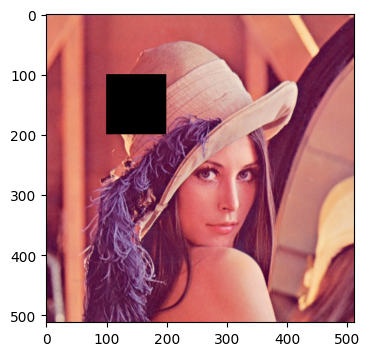

In [9]:
img_rgb_2 = img_rgb.copy()
img_rgb_2[100:200, 100:200] = 0

plt.figure(figsize=[4, 4])
plt.imshow(img_rgb_2);

прибавить какое-либо значение блоку(пикселю):

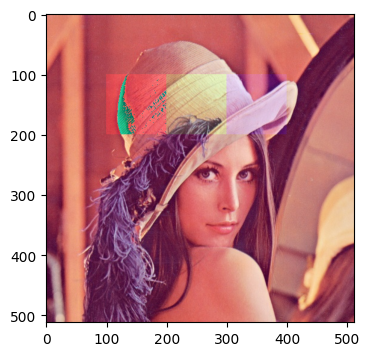

In [10]:
img_rgb_3 = img_rgb.copy()
img_rgb_3[100:200, 100:200, 0] += 40
img_rgb_3[100:200, 200:300, 1] += 40
img_rgb_3[100:200, 300:400, 2] += 40

plt.figure(figsize=[4, 4])
plt.imshow(img_rgb_3);

### Вопрос

- Что произошло с цветами на изображении img_rgb_3? Почему так произошло?

**Ответ**: В каждой прямоугольной области соответствующий канал цвета стал более ярко выражен (левый - красный, средний - зеленый, правый - синий). Местами появились неестественные цвета (заметнее всего на красном квадратике), причина: максимально возможное значение цвета здесь - 255, и если прибавить 40, то получится 39 (255 + 1 = 0 в uint8).

## Альтернативы OpenCV

1. Библиотека `Pillow` (Python Imaging Library, PIL). В OpenCV изображения представляются в виде матриц, а в Pillow - в виде объектов класса `Image`.

In [11]:
from PIL import Image

img_pil = Image.open(IMG_PATH)
print('type(img_pil) = ', type(img_pil))
print('img_pil.size = ', img_pil.size)
print('img_pil.mode = ', img_pil.mode)

type(img_pil) =  <class 'PIL.JpegImagePlugin.JpegImageFile'>
img_pil.size =  (512, 512)
img_pil.mode =  RGB


2. Библиотека `scikit-image`. Изображения представлены в виде `np.ndarray`. Порядок каналов - **сразу RGB**. `shape` - (H, W, C), **channel-last**.

type(img_ski) =  <class 'numpy.ndarray'>
img_ski.shape =  (512, 512, 3)
img_ski.dtype =  uint8


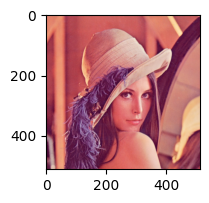

In [12]:
import skimage as ski

img_ski = ski.io.imread(IMG_PATH)
print('type(img_ski) = ', type(img_ski))
print('img_ski.shape = ', img_ski.shape)
print('img_ski.dtype = ', img_ski.dtype)

plt.figure(figsize=[2, 2])
plt.imshow(img_ski);

3. `torchvision` - библиотека для работы с изображениями, входящая в состав PyTorch. Изображения представлены в виде `torch.Tensor`. Порядок каналов - **сразу RGB**. `shape` - (C, H, W), **channel-first**.

In [13]:
from torchvision.io import read_image  # читает изображение сразу в формате torch.Tensor

img_torch = read_image(IMG_PATH)
print('type(img_torch) = ', type(img_torch))
print('img_torch.shape = ', img_torch.shape)
print('img_torch.dtype = ', img_torch.dtype)

type(img_torch) =  <class 'torch.Tensor'>
img_torch.shape =  torch.Size([3, 512, 512])
img_torch.dtype =  torch.uint8


4. **DALI** - библиотека для быстрой обработки изображений на GPU. Подробнее: https://developer.nvidia.com/blog/rapid-data-pre-processing-with-nvidia-dali/

## Упражнения

### Упражнение 1: BGR -> RGB
Реализуйте функцию преобразования изображения в формате BGR в формат RGB

In [14]:
def convert_color_bgr_to_rgb(img_bgr: np.ndarray) -> np.ndarray:
    img_rgb = img_bgr.copy()
    for i in range(img_rgb.shape[0]):
        for j in range(img_rgb.shape[1]):
            img_rgb[i][j] = img_rgb[i][j][::-1] # цвета в обратном порядке
    return img_rgb

In [15]:
assert((img_rgb == convert_color_bgr_to_rgb(img)).all())

### Упражнение 2: Изменение яркости
Одним из простейших преобразований изображения является изменение уровня яркости, задаваемое следующим образом:

$$
f'(x, y) = \alpha f(x, y) + \beta
$$

Реализуйте данную операцию с помощью `cv2.convertScaleAbs` - [туториал](https://docs.opencv.org/4.x/d3/dc1/tutorial_basic_linear_transform.html).

В данном упражнении необходимо исследовать работу функции при различных значениях параметров. Протестируйте разные значения alpha и beta, например $\alpha \in \set{0.8, 1, 1.2, 2}$, $\beta \in \set{-10, 0, 10}$

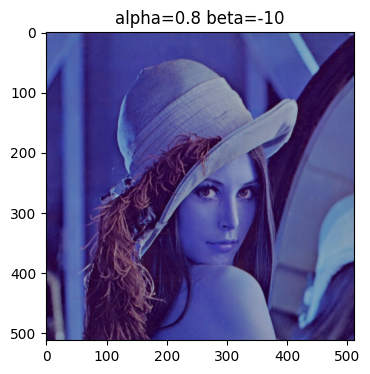

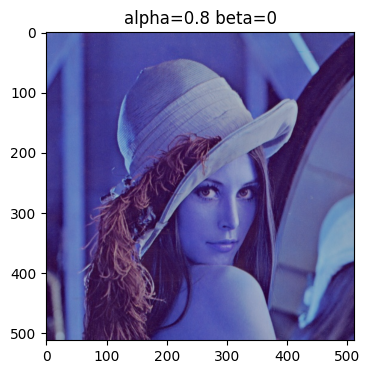

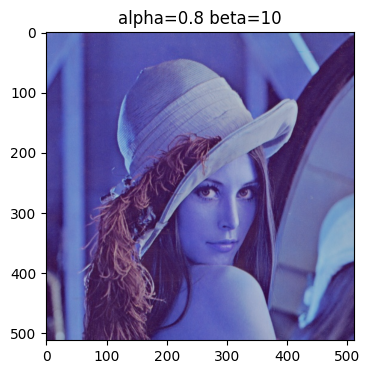

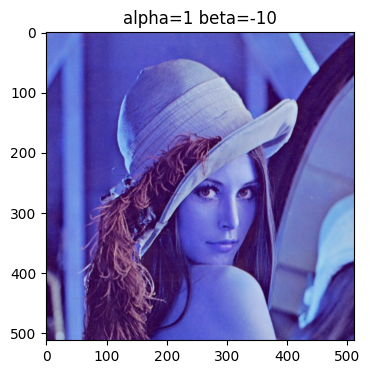

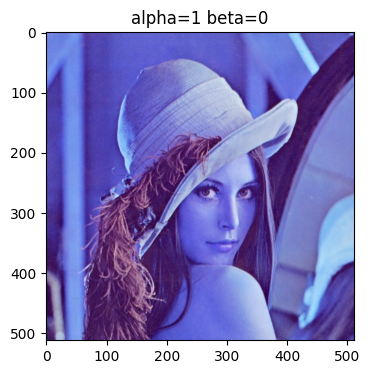

...

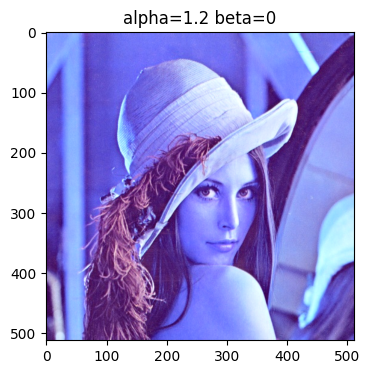

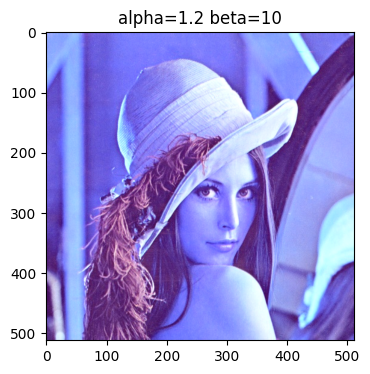

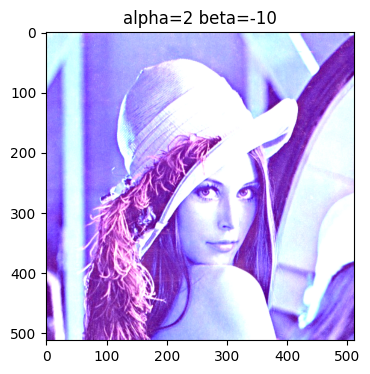

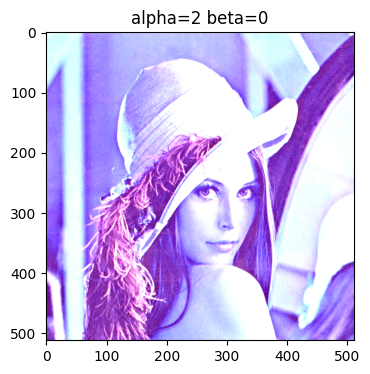

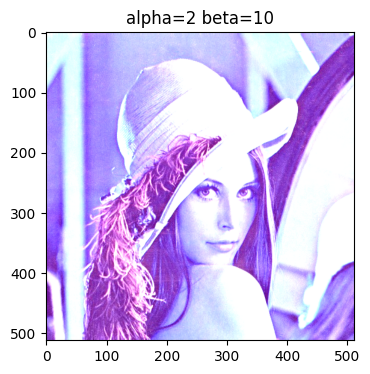

In [16]:
alphas = [0.8, 1, 1.2, 2]
betas = [-10, 0, 10]

for alpha in alphas:
    for beta in betas:
        img_new = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)

        plt.figure(figsize=[4, 4])
        plt.title(f'alpha={alpha} beta={beta}')
        plt.imshow(img_new)

### Упражнение 3: Смешивание изображений $\alpha - blend$

Другим простым преобразованием является смешивание двух изображений, задаваемое как:

$$
    f'(x, y) = \alpha f_1(x, y) + (1 - \alpha) f_2(x, y)
$$

Реализуйте данную операцию с помощью `cv2.addWeighted` - [туториал](https://docs.opencv.org/3.4/d5/dc4/tutorial_adding_images.html).

Вы можете использовать изображение `data/opencv_logo.jpeg` или загрузить свое.


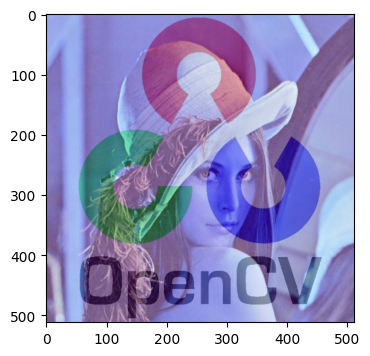

In [17]:
alpha = 0.7
beta = 1 - alpha

logo = cv2.imread('data/opencv_logo.jpeg')[..., ::-1]

img_new = cv2.addWeighted(img, alpha, logo, beta, 0.0)

plt.figure(figsize=[4, 4])
plt.imshow(img_new);

## Нанесение текста и фигур

С помощью OpenCV можно добавить дополнительные элементы на изображение, такие как текст, простые геометрические фигуры и т.д. (см. https://docs.opencv.org/4.x/dc/da5/tutorial_py_drawing_functions.html)

In [18]:
TEXT = 'Lenna 0.99'
UL_CORNER = (200, 200)  # верхний левый угол
FONT = 0                # шрифт
SCALE = 1               # размер
COLOR = (0, 255, 0)     # цвет - зеленый
THICKNESS = 2           # толщина линий

img_rgb_4 = img_rgb.copy()

cv2.putText(img_rgb_4, TEXT, UL_CORNER, FONT, SCALE, COLOR, THICKNESS)
cv2.rectangle(img_rgb_4, UL_CORNER, (370, 400), COLOR, THICKNESS);

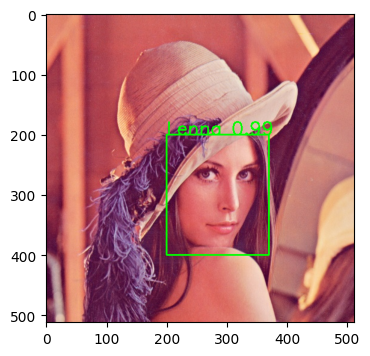

In [19]:
plt.figure(figsize=[4, 4])
plt.imshow(img_rgb_4);

### Вопрос

- Зачем может понадобиться рисовать на изображении?

**Ответ**: рисование на изображении может быть полезно для визуализации и отладки. Например, у нас есть датасет с изображениями лиц и координатами BoundingBox'ов лиц. Было бы неплохо отрисовать несколько BoundingBox'ов и посмотреть, как вообще разметка выглядит. Или, к примеру, можно на кадры видео писать информацию о времени/месте съемки, о параметрах камеры. Другое возможное применение - AR, дополненная реальность вообще без рисования поверх изображений не обходится.  

# 2. Фильтр Байера

Сырые изображения, приходящие с камеры, являются байеризованными. Они представлены в виде двумерного массива, где отдельные пиксели кодируют интенсивность синего, зеленого, красного цветов. 

![Фильтр Байера](data/bayer.jpeg)


## Домашнее задание (опциональное)

В ноутбуке [`demosaicing.ipynb`](demosaicing.ipynb).

Вспомогательные материалы - [слайды](slides_demosaicing.pdf).


# Часть 2

In [20]:
AERIAL_IMG_PATH = "data/aerial_image.jpg"
SUNFLOWER_IMG_PATH = "data/sunflower.jpg"

# if not Path(AERIAL_IMG_PATH).exists() or not Path(SUNFLOWER_IMG_PATH).exists():
#     !git clone https://github.com/alexmelekhin/cv_course_2023.git
#     !mv cv_course_2023/seminars/seminar_02/data .

# 1. Цветовые пространства

Наиболее распространенным представлением цвета пикселя является пространство RGB. В таком представлении цвет представлен тремя числами: интенсивностями красного, зеленого и синего базисных цветов.

In [21]:
img = cv2.imread(SUNFLOWER_IMG_PATH)

In [22]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

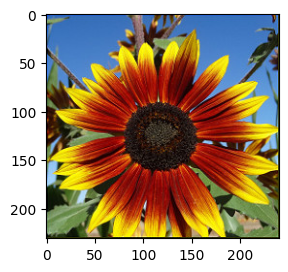

In [23]:
plt.figure(figsize=[3, 3])
plt.imshow(img_rgb);

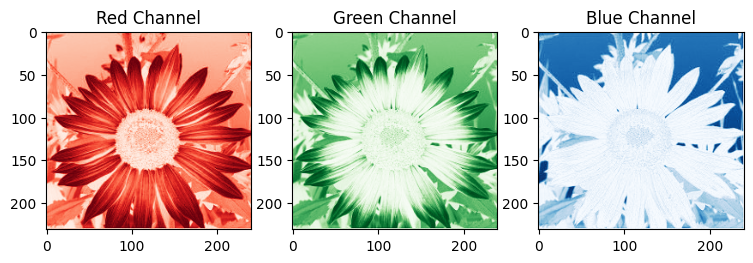

In [24]:
plt.figure(figsize=[9, 3])

plt.subplot(131)
plt.imshow(img_rgb[:,:,0], cmap='Reds')
plt.title('Red Channel')

plt.subplot(132)
plt.imshow(img_rgb[:,:,1], cmap='Greens')
plt.title('Green Channel')

plt.subplot(133)
plt.imshow(img_rgb[:,:,2], cmap='Blues')
plt.title('Blue Channel')

plt.show()

cvtColor поддерживает конвертацию между множеством других цветовых схем. К примеру, чтобы получить серое изобаржение из цветного достаточно:

In [25]:
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

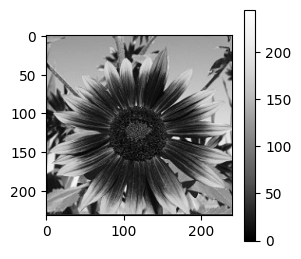

In [26]:
plt.figure(figsize=[3, 3])
plt.imshow(img_gray, cmap='Greys_r')
plt.colorbar()
plt.show()

## Вопрос 1

**Этот и все последующие вопросы - оцениваемые, для самостоятельной работы.**

Можно ли получить черно-белое изображение из RGB представления путем вычисления среднего значения интенсивностей каналов R, G и B? Почему?

**Ответ:** да, можно, но это будет не совсем корректно с точки зрения цветовосприятия человеческого глаза. В цветовой модели YUV определены коэффициенты для каждого канала изображения в формате RGB для перевода его в чёрно-белое: $Y (яркость) = 0.299 \cdot R + 0.587 \cdot G + 0.114 \cdot B$. YUV-изображение уже больше похоже на то, как воспринимает цвета человек. Наибольший вклад вносит зелёный, а наименьший — синий цвет.

## Вопрос 2

Почему мы использовали флаг `cmap='Greys_r'` при отображении черно-белого изображения? Чем отличается от `cmap='Greys'`?

**Ответ:** Флаг `cmap='Greys_r'` указывает Matplotlib использовать обратную (**r**eversed) палитру оттенков серого. В OpenCV по умолчанию 0 = чёрный, 255 = белый, а в Matplotlib наоборот: 0 = белый, 255 = чёрный. Так как мы работаем с изображениями из OpenCV, используем этот флаг. Ниже продемонстрировано сравнение этих цветовых палитр.

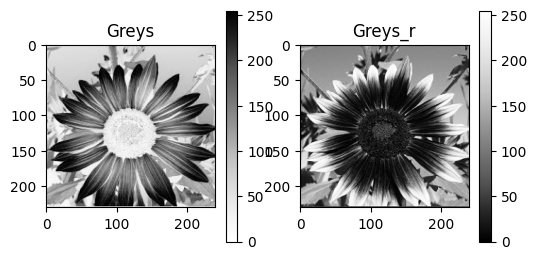

In [27]:
plt.figure(figsize=[6, 3])

plt.subplot(121)
plt.imshow(img_rgb[:,:,0], cmap='Greys')
plt.title('Greys')
plt.colorbar()

plt.subplot(122)
plt.imshow(img_rgb[:,:,1], cmap='Greys_r')
plt.title('Greys_r')
plt.colorbar()

plt.show()

Если не предполагается использовать информацию о цвете пикселей, то можно сразу загрузить изображение в оттенках серого:

In [28]:
img_gray = cv2.imread(SUNFLOWER_IMG_PATH, cv2.IMREAD_GRAYSCALE)

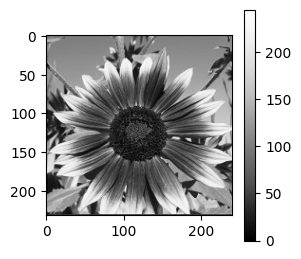

In [29]:
plt.figure(figsize=[3, 3])
plt.imshow(img_gray, cmap='Greys_r')
plt.colorbar()
plt.show()

серое изображение - двумерный массив:

In [30]:
print('type(img_gray) = ', type(img_gray))
print('img_gray.shape = ', img_gray.shape)
print('img_gray.dtype = ', img_gray.dtype)

type(img_gray) =  <class 'numpy.ndarray'>
img_gray.shape =  (231, 240)
img_gray.dtype =  uint8


## Упражнение 1: RGB to gray

**Это и все последующие упражения - оцениваемые, для самостоятельной работы.**

Реализуйте функцию преобразования цветного изображения в формате RGB в серое

In [31]:
def convert_rgb_to_grayscale(img_rgb):
    h, w, _ = img_rgb.shape
    gray = np.zeros((h, w), dtype=np.uint8)
    for i in range(h):
        for j in range(w):
            r, g, b = img_rgb[i][j]
            gray[i][j] = np.round(0.29901 * r + 0.58701 * g + 0.114 * b)
    return gray

In [32]:
assert((cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY) == convert_rgb_to_grayscale(img_rgb)).all())

Кроме RGB/BGR и grayscale существуют и другие цветовые представления. Преобразования между ними можно осуществлять с помощью библиотеки OpenCV следующим способом:

## RGB to HSV

HSV - цветовое пространство, в котором цвет представлен тремя компонентами: Hue (оттенок), Saturation (насыщенность) и Value (значение). Это позволяет задавать цвета в более естественной форме, чем RGB.

**Составляющая H** соответствует цветовому тону и варьируется в пределах 0–360°, в частности 0° – чистый красный цвет, 60° – жёлтый, 120° – зеленый, 180° – голубой, 240° – синий, 300° – фиолетовый.

**Насыщенность S** позволяет оценить насколько «чистым» является данный цвет, она определяет соотношение серого цвета и выбранного оттенка и варьируется от 0 (серый) до 1 (полностью насыщенный).

**Мера яркости V** задает относительную освещенность и измеряется в диапазоне от 0 (черный) до 1 (белый).

Цветовая модель HSV связана с моделью RGB нелинейным преобразованием:
$$
H = 
\begin{cases} 
H_1, & \text{если } B \leq G, \\
360^\circ - H_1, & \text{если } B > G, 
\end{cases}
\text{где } H_1 = \arccos\left( \frac{0.5[(R - G) + (R - B)]}{\sqrt{(R - G)^2 + (R - B)(G - B)}} \right),
$$

$$
S = \frac{\max(R, G, B) - \min(R, G, B)}{\max(R, G, B)}, \quad 
V = \frac{\max(R, G, B)}{255}
$$

In [33]:
img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

можно попробовать отобразить изображение так же, как и RGB:

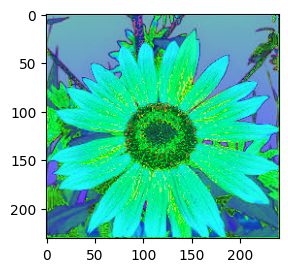

In [34]:
plt.figure(figsize=[3, 3])
plt.imshow(img_hsv);

Однако это не совсем корректно, так как Hue - это угол, а не интенсивность. Поэтому лучше отобразить оттенок в виде цвета, а насыщенность и значение - в виде яркости:

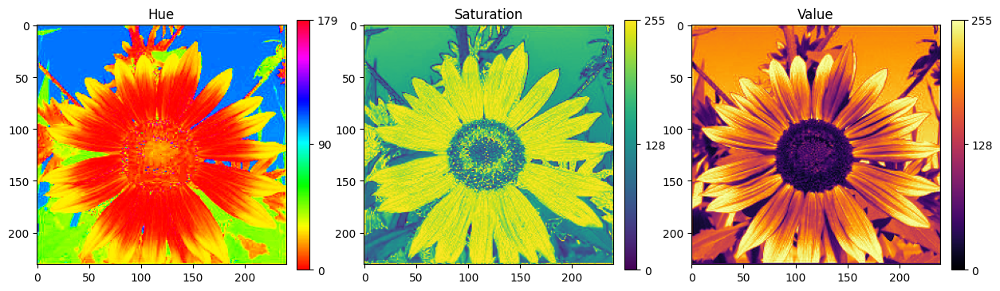

In [35]:
h, s, v = cv2.split(img_hsv)

fig, axs = plt.subplots(1, 3, figsize=[15, 5])

im1 = axs[0].imshow(h, cmap="hsv")
axs[0].set_title('Hue')
cbar1 = plt.colorbar(im1, ax=axs[0], fraction=0.046, pad=0.04, ticks=[0, 90, 179])
cbar1.ax.set_yticklabels(['0', '90', '179'])

im2 = axs[1].imshow(s, cmap="viridis")  # Using 'viridis' for Saturation
axs[1].set_title('Saturation')
cbar2 = plt.colorbar(im2, ax=axs[1], fraction=0.046, pad=0.04, ticks=[0, 128, 255])
cbar2.ax.set_yticklabels(['0', '128', '255'])

im3 = axs[2].imshow(v, cmap="inferno")  # Using 'inferno' for Value
axs[2].set_title('Value')
cbar3 = plt.colorbar(im3, ax=axs[2], fraction=0.046, pad=0.04, ticks=[0, 128, 255])
cbar3.ax.set_yticklabels(['0', '128', '255'])

plt.show()

## Упражнение 2

Попробуйте другие цветовые пространства, конвертация в которые реализована в OpenCV.

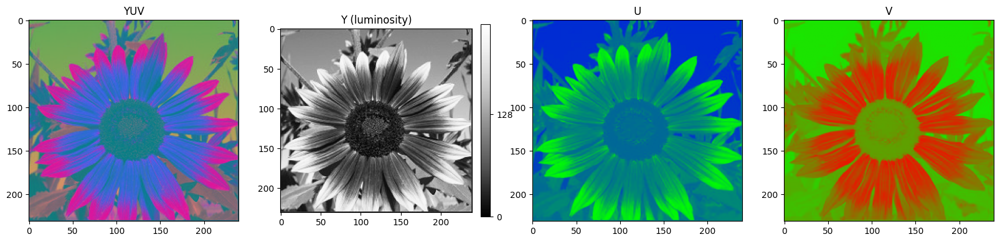

In [36]:
# your code here

# RGB -> YUV
from matplotlib.colors import ListedColormap

# 1. Green-Red (зелёный → красный)
green_red = np.linspace([0, 1, 0, 1], [1, 0, 0, 1], 256)
cmap_green_red = ListedColormap(green_red)

# 2. Green-Blue (зелёный → синий)
green_blue = np.linspace([0, 1, 0, 1], [0, 0, 1, 1], 256)
cmap_green_blue = ListedColormap(green_blue)

img_yuv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2YUV)

y, u, v = cv2.split(img_yuv)

fig, axs = plt.subplots(1, 4, figsize=[20, 5])

im0 = axs[0].imshow(img_yuv)
axs[0].set_title('YUV')

im1 = axs[1].imshow(y, cmap="Greys_r") # Y = K_R * R + (1 - K_R - K_B) * G + K_B * B
axs[1].set_title('Y (luminosity)')
cbar1 = plt.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04, ticks=[0, 128, 255])
cbar1.ax.set_yticklabels(['0', '128', '255'])

im2 = axs[2].imshow(u, cmap=cmap_green_blue)
axs[2].set_title('U')

im3 = axs[3].imshow(v, cmap=cmap_green_red)
axs[3].set_title('V')


plt.show()

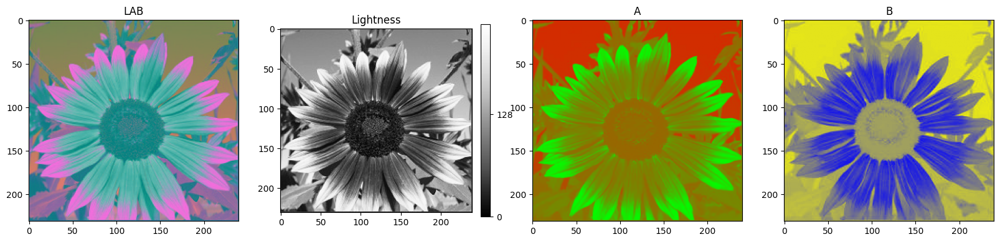

In [37]:
# your code here

# RGB -> LAB (Lightness, A, B)
from matplotlib.colors import ListedColormap

# 1. Green-Red (зелёный → красный)
green_red = np.linspace([0, 1, 0, 1], [1, 0, 0, 1], 256)
cmap_green_red = ListedColormap(green_red)

# 2. Yellow-Blue (жёлтый → синий)
yellow_blue = np.linspace([1, 1, 0, 1], [0, 0, 1, 1], 256)
cmap_yellow_blue = ListedColormap(yellow_blue)

img_lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)

l, a, b = cv2.split(img_lab)

fig, axs = plt.subplots(1, 4, figsize=[20, 5])

im0 = axs[0].imshow(img_lab)
axs[0].set_title('LAB')

im1 = axs[1].imshow(y, cmap="Greys_r")
axs[1].set_title('Lightness')
cbar1 = plt.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04, ticks=[0, 128, 255])
cbar1.ax.set_yticklabels(['0', '128', '255'])

im2 = axs[2].imshow(u, cmap=cmap_green_red)
axs[2].set_title('A')

im3 = axs[3].imshow(v, cmap=cmap_yellow_blue)
axs[3].set_title('B')


plt.show()

## Вопрос 3

В каких задачах переход из RGB в другое цветовое пространство может быть полезным?

**Ответ:** Переход из RGB в другие цветовые пространства может быть полезен, например, когда мы хотим отделить информацию о цвете от информации о яркости. Для выделения краёв объектов на изображении (в том числе для распознавания символов) не так важен сам цвет, как изменение яркости, поэтому для таких задач выгодно преобразовать изображение в Grayscale. Если важен именно цвет (например, на видео нужно проследить за красным мячиком), то может быть полезным преобразование в HSV.

# 2. Гистограмма изображения

Напомним, что гистограммой изображения называется функция, показыващая количество пикселей изображения с заданным в качестве аргумента значением интенсивности:

$$
    h(v) = \sum_{x = 0}^{W - 1} \sum_{y = 0}^{H - 1} [f(x, y) = v] 
$$

Если дополнительно потребовать, чтобы $\sum_{v = 0}^{255} h(v) = 1$, то $h$ будет представлять функцию плотности распределения интенсивности на изображении.

Определим вспомогательную функцию, позволяющую визуализировать гистограмму:

In [38]:
def visualize_hist(hist):
    plt.figure(figsize=[12, 3])
    plt.bar(np.arange(len(hist)), hist / hist.sum())

Рассчитать гистограмму можно с помощью встроенной функции OpenCV:

In [39]:
hist_cv = cv2.calcHist([img_gray],      # список изображений
                       [0],             # список каналов
                       None,            # маска (без маски)
                       [256],           # размер гистограммы
                       [0, 256])[:, 0]  # диапазон значений

Результат представляет собой обычный массив длины 256:

In [40]:
print('hist_cv.shape = ', hist_cv.shape)

hist_cv.shape =  (256,)


и выглядит следующим образом:

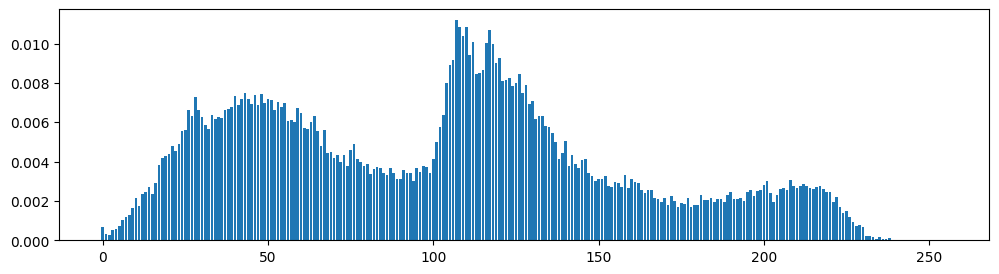

In [41]:
visualize_hist(hist_cv)

## Упражнение 3: Построение гистограммы

Реализуйте функцию для расчета гистограммы изображения. Используйте ее для визуализации трех каналов RGB изображения.

In [42]:
def compute_hist(img):
    # your code here
    hist = np.zeros((256,), dtype=np.uint)
    h, w = img.shape
    for i in range(h):
        for j in range(w):
            hist[img[i][j]] += 1 # увеличиваем кол-во пикселей с интенсивностью img[i][j]
    return hist

In [43]:
hist_gray = compute_hist(img_gray)

hist_r = compute_hist(img_rgb[:, :, 0])
hist_g = compute_hist(img_rgb[:, :, 1])
hist_b = compute_hist(img_rgb[:, :, 2])

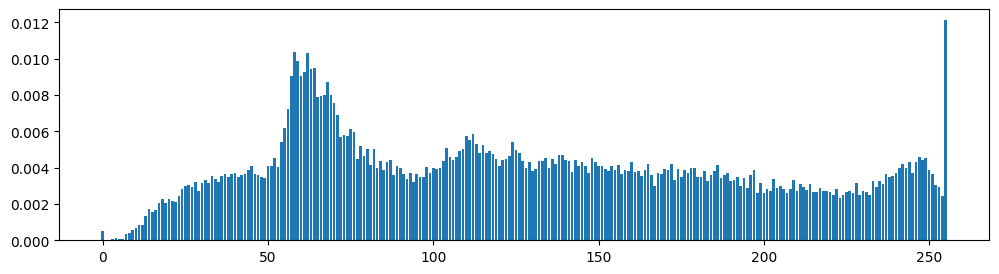

In [44]:
visualize_hist(hist_r)

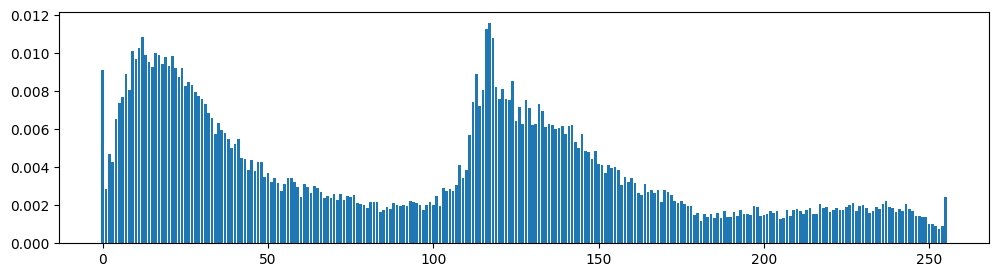

In [45]:
visualize_hist(hist_g)

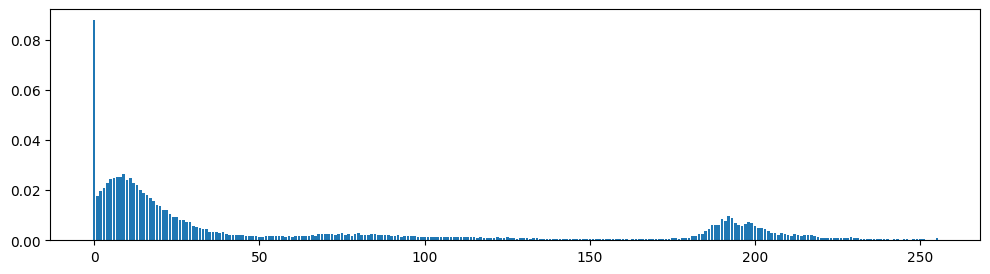

In [46]:
visualize_hist(hist_b)

In [47]:
assert((hist_gray == hist_cv).all())

## Вопрос 4

 Что можно сказать об изображении по его гистограмме?

**Ответ:** Гистограмма хорошо отображает укрупненные признаки (тени, полутона, яркие детали). Например, если в гистограмме много пикселей интенсивности ~0 — изображение тёмное, возможно, снятое ночью; если много пикселей интенсивности ~255 — фото может быть засвечено, может быть плохая экспозиция, а может, фотографировали небо. По гистограмме также можно судить о контрастности изображения: чем больше значение `hist.max() - hist.min()`, тем контрастнее изображение. Для RGB изображений по гистограммам для каждого канала цвета можно судить о цветовом балансе.

## Вопрос 5

Допустим, вы смотрите некоторый фильм и для текущего кадра выводите его гистограмму. Как будет меняться эта гистограмма с течением времени? Опишите несколько случаев: смена камеры, смена освещения, смена сцены.

**Ответ:**
* **Смена камеры**: Если сцена остаётся той же, то гистограмма сохранит общий вид, но могут быть незначительные сдвиги из-за изменений экспозиции/зума/ракурса.
* **Смена освещения**: Пики гистограммы сместятся. Если освещение стало темнее — сместятся влево, если светлее, то вправо. От того, насколько резко изменяется освещение, зависит скорость сдвига пиков.
* **Смена сцены**: Наиболее вероятно, что изменится цветовой баланс для каждого из каналов RGB. Смена сцены также может включать в себя смену камеры и освещения, тогда вышеописанные эффекты актуальны и в данном случае.

## Упражнение 4: JPEG и гистограмма

Исследуйте, как влияет степень сжатия алгоритма JPEG на вид гистограммы изображения.

Используйте черно-белое изображение `img_gray`. Визуализируйте степени сжатия 90, 60, 30, 5.

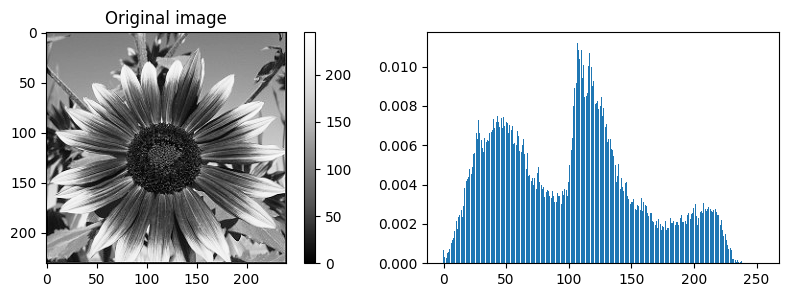

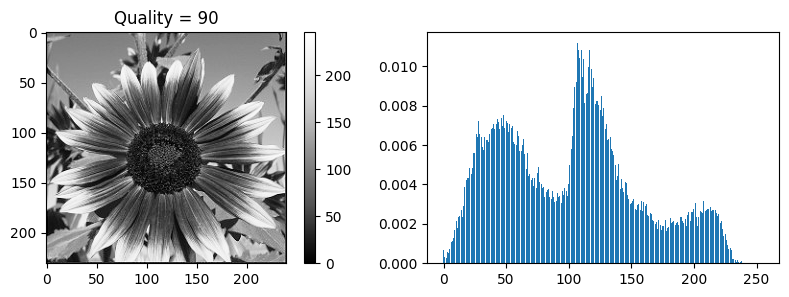

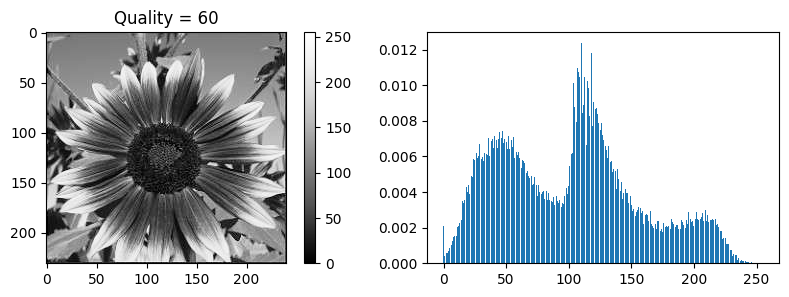

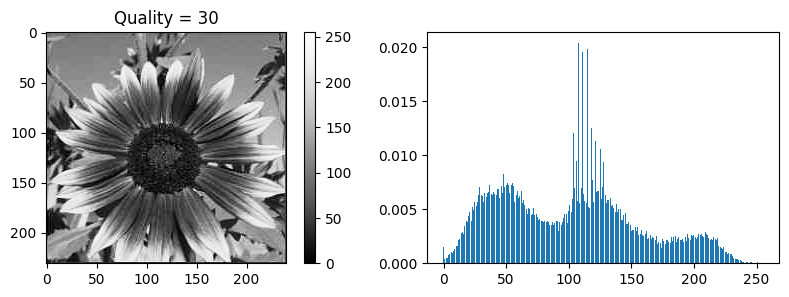

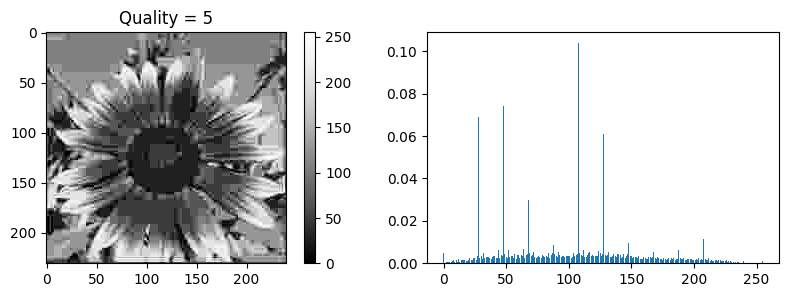

In [48]:
# your code here

# original image
fig, axs = plt.subplots(1, 2, figsize=[10, 3])

im0 = axs[0].imshow(img_gray, cmap='Greys_r')
axs[0].set_title(f'Original image')
cbar0 = plt.colorbar(im0, ax=axs[0])

hist = compute_hist(img_gray)
im1 = axs[1].bar(np.arange(len(hist)), hist / hist.sum())
plt.show()

# compressed images
for quality in [90, 60, 30, 5]:
    _, img_jpg_encoded = cv2.imencode('.jpg', img_gray, (cv2.IMWRITE_JPEG_QUALITY, quality))
    img_jpg = cv2.imdecode(img_jpg_encoded, cv2.IMREAD_GRAYSCALE)

    fig, axs = plt.subplots(1, 2, figsize=[10, 3])

    im0 = axs[0].imshow(img_jpg, cmap='Greys_r')
    axs[0].set_title(f'Quality = {quality}')
    cbar0 = plt.colorbar(im0, ax=axs[0])

    hist = compute_hist(img_jpg)
    im1 = axs[1].bar(np.arange(len(hist)), hist / hist.sum())
    plt.show()
    

Прокомментируем полученные данные: чем сильнее сжатие, тем больше блоки из одинаковых пикселей на изображении. Из-за этого на гистограмме появляются явно выраженные пики, а количество пикселей других интенсивностей заметно снижается.

## Упражнение 5: Сегментация

На загруженном аэроортофотоплане выделите зеленые насаждения. Для этого постройте бинарную маску, где 1 будет отвечать наличию насаждений в данном пикселе, 0 - их отсутствию, и визуализируйте её. А также рассчитайте, какую долю изображения занимают зеленые насаждения. С какой ошибкой (погрешностью) получена эта величина?

**Подсказка:** вам должно помочь HSV пространство и гистограмма. Погрешность может быть оценена на глаз, по вашей неуверенности в определении порога отделения классов 'зеленые насаждения'/'прочее'.

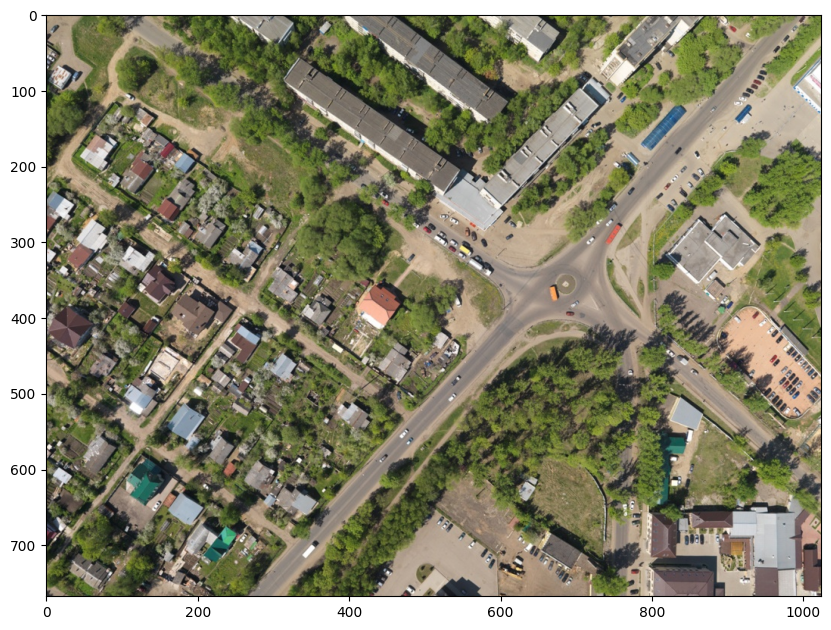

In [49]:
aerial_image = cv2.cvtColor(cv2.imread(AERIAL_IMG_PATH), cv2.COLOR_BGR2RGB)

plt.figure(figsize=[10, 10])
plt.imshow(aerial_image);

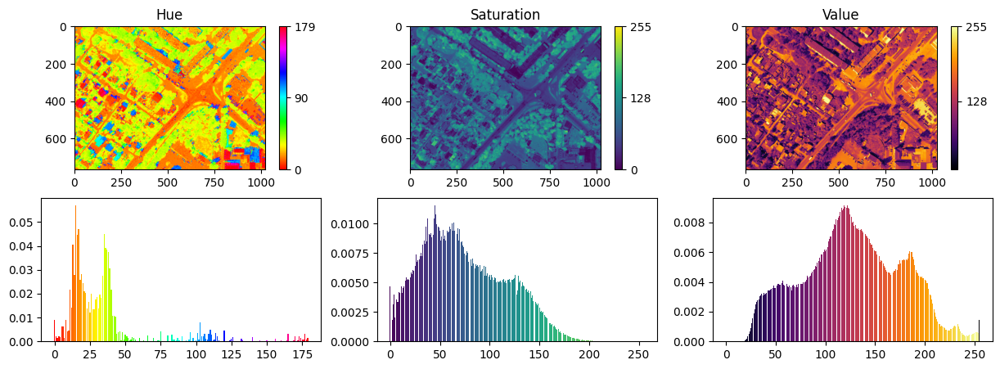

In [50]:
# your code here
def compute_custom_hist(img, max_val=255):
    hist = np.zeros((max_val + 1,), dtype=np.uint)
    h, w = img.shape
    for i in range(h):
        for j in range(w):
            hist[img[i][j]] += 1 # увеличиваем кол-во пикселей с интенсивностью img[i][j]
    return hist

def visualize_hsv(img_hsv):
    h, s, v = cv2.split(img_hsv)

    fig, axs = plt.subplots(2, 3, figsize=[15, 5])

    im1 = axs[0][0].imshow(h, cmap="hsv")
    axs[0][0].set_title('Hue')
    cbar1 = plt.colorbar(im1, ax=axs[0][0], ticks=[0, 90, 179])
    cbar1.ax.set_yticklabels(['0', '90', '179'])
    hist1 = compute_custom_hist(h, max_val=179)
    axs[1][0].bar(np.arange(len(hist1)), hist1 / hist1.sum(), color=plt.get_cmap('hsv')(np.arange(179) / 179))

    im2 = axs[0][1].imshow(s, cmap="viridis")
    axs[0][1].set_title('Saturation')
    cbar2 = plt.colorbar(im2, ax=axs[0][1], ticks=[0, 128, 255])
    cbar2.ax.set_yticklabels(['0', '128', '255'])
    hist2 = compute_custom_hist(s, max_val=255)
    axs[1][1].bar(np.arange(len(hist2)), hist2 / hist2.sum(), color=plt.get_cmap('viridis')(np.arange(255) / 255))

    im3 = axs[0][2].imshow(v, cmap="inferno")
    axs[0][2].set_title('Value')
    cbar3 = plt.colorbar(im3, ax=axs[0][2], ticks=[0, 128, 255])
    cbar3.ax.set_yticklabels(['0', '128', '255'])
    hist3 = compute_custom_hist(v, max_val=255)
    axs[1][2].bar(np.arange(len(hist3)), hist3 / hist3.sum(), color=plt.get_cmap('inferno')(np.arange(255) / 255))

    plt.show()

aerial_hsv = cv2.cvtColor(aerial_image, cv2.COLOR_RGB2HSV)
visualize_hsv(aerial_hsv)


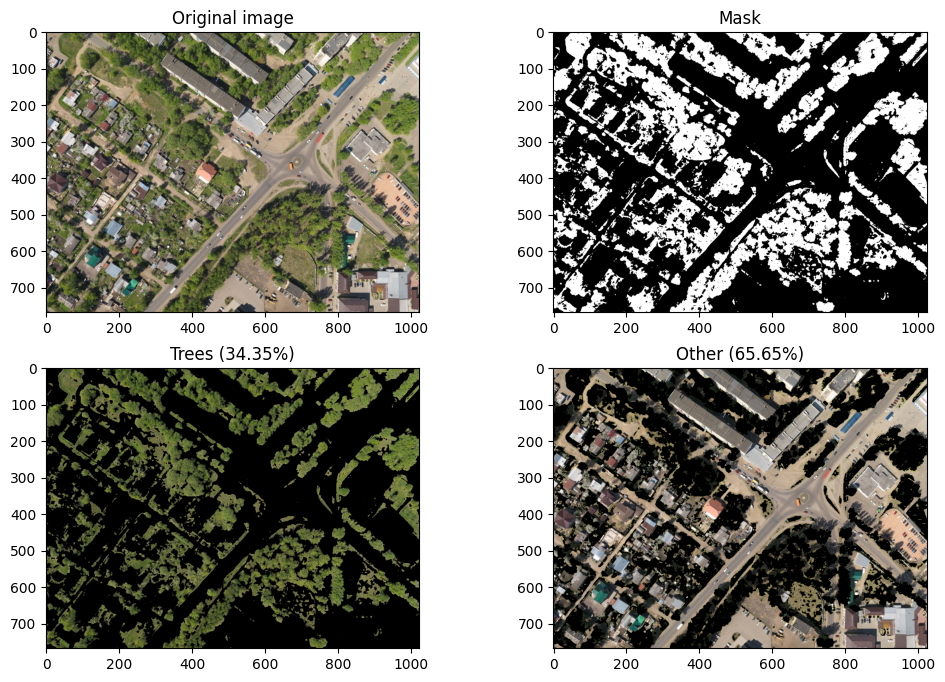

In [51]:
def segment_trees(img_hsv: np.ndarray, 
                  min_h: np.uint=26, max_h: np.uint=75,
                  min_s: np.uint=60, max_s: np.uint=255,
                  min_v: np.uint=50, max_v: np.uint=160,
                  ) -> np.ndarray:
    h, s, v = cv2.split(img_hsv)
    mask = (min_h < h) & (h < max_h) & \
           (min_s < s) & (s < max_s) & \
           (min_v < v) & (v < max_v)
    mask = mask.astype(np.uint8)
    return mask

def setup_ax(axs, i1, i2, img, cmap, title):
    axs[i1][i2].set_title(title)
    if cmap:
        im = axs[i1][i2].imshow(img, cmap=cmap)
    else:
        im = axs[i1][i2].imshow(img)

fig, axs = plt.subplots(2, 2, figsize=[12, 8])

mask = segment_trees(aerial_hsv, min_h=26, max_h=55)
trees = aerial_image.copy()
other = aerial_image.copy()
trees[mask == 0] = 0
other[mask == 1] = 0

setup_ax(axs, 0, 0, aerial_image, None, 'Original image')
setup_ax(axs, 0, 1, mask, 'binary_r', 'Mask')
setup_ax(axs, 1, 0, trees, None, f'Trees ({(mask == 1).sum() * 100 / mask.size:.2f}%)')
setup_ax(axs, 1, 1, other, None, f'Other ({(mask == 0).sum() * 100 / mask.size:.2f}%)')

plt.show()

Субъективная погрешность: ±2%

# 3. Интегральные изображения

## Упражнение 6

Напомним, что интегральным изображением называется следующая функция:

$$
    I(x, y) = \sum_{i = 0}^{x} \sum_{j = 0}^{y} f(i, j)
$$

С помощью интегрального изображения можно за $O(1)$ вычислять сумму интенсивностей в произвольной прямоугольной области. Требуется реализовать расчет интегрального изображения, а также быстрый расчет сумм интенсивностей в прямоугольнике заданном верхним левым углом, шириной и высотой $x, y, w, h$.

$$
    L(x,y) = I(x,y) + L(x,y-1) + L(x-1,y) – L(x-1,y-1)
$$

<img src="data/input_image.jpg" width="30%" /> <img src="data/integral_image.jpg" width="30%" /> <img src="data/rect.jpg" width="30%" />

In [52]:
class IntegralImage:

    def __init__(self, img):
        assert(len(img.shape) == 2)  # только для серых изображений

        self.img = img

        # your code here
        self.intensity = np.zeros(img.shape)
        for i in range(img.shape[0]):
            for j in range(img.shape[1]):
                self.intensity[i][j] = img[i][j]
                if i > 0:
                    self.intensity[i][j] += self.intensity[i - 1][j]
                if j > 0:
                    self.intensity[i][j] += self.intensity[i][j - 1]
                if i > 0 and j > 0:
                    self.intensity[i][j] -= self.intensity[i - 1][j - 1]

    def sum(self, x, y, w, h):
        # your code here
        s = self.intensity[y + h - 1][x + w - 1]
        if x > 0:
            s -= self.intensity[y + h - 1][x - 1]
        if y > 0:
            s -= self.intensity[y - 1][x + w - 1]
        if x > 0 and y > 0:
            s += self.intensity[y - 1][x - 1]
        return s

In [53]:
I = IntegralImage(img_gray)

In [54]:
x, y, w, h = 0, 0, 100, 100
assert(img_gray[y:y + h, x:x + w].sum() == I.sum(x, y, w, h))

x, y, w, h = 100, 100, 100, 100
assert(img_gray[y:y + h, x:x + w].sum() == I.sum(x, y, w, h))

## Вопрос 6

В каких задачах может потребоваться использовать интегральное изображение?

**Ответ:** В задачах, где требуется быстрый подсчёт суммы интенсивностей в прямоугольной области. Примеры: обнаружение объектов на изображении (алгоритм Виолы-Джонса), фильтрация изображения (скользящее среднее, размытие).